In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications
from tensorflow.keras import models, layers
from tensorflow.keras.layers import Rescaling,RandomRotation,Resizing,RandomFlip
import matplotlib.pyplot as plt
import os
import shutil
from pathlib import Path

2025-07-05 21:09:00.664945: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751729940.755843  187508 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751729940.782720  187508 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751729940.935791  187508 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751729940.935826  187508 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751729940.935829  187508 computation_placer.cc:177] computation placer alr

In [2]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3

In [3]:
pepper_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/home/abhishek/split_plants_data/Pepper',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2475 files belonging to 2 classes.


I0000 00:00:1751729983.329297  187508 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2608 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5


In [4]:
potato_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/home/abhishek/split_plants_data/Potato',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [5]:
tomato_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/home/abhishek/split_plants_data/Tomato',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 16011 files belonging to 10 classes.


In [6]:
pepper_classes = pepper_dataset.class_names
potato_classes = potato_dataset.class_names
tomato_classes = tomato_dataset.class_names

In [7]:
print(pepper_classes,'\n\n',
     potato_classes,'\n\n',
     tomato_classes)

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy'] 

 ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy'] 

 ['Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


In [8]:
def plotting_data(dataset,class_names):    
    plt.figure(figsize=(15,15))
    for image_batch, label_batch in dataset.take(1):
        for i in range(12):
            plt.subplot(3,4,i+1)
            plt.imshow(image_batch[i].numpy().astype('int'))
            plt.title(class_names[int(label_batch[i])])

2025-07-05 21:09:56.516024: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


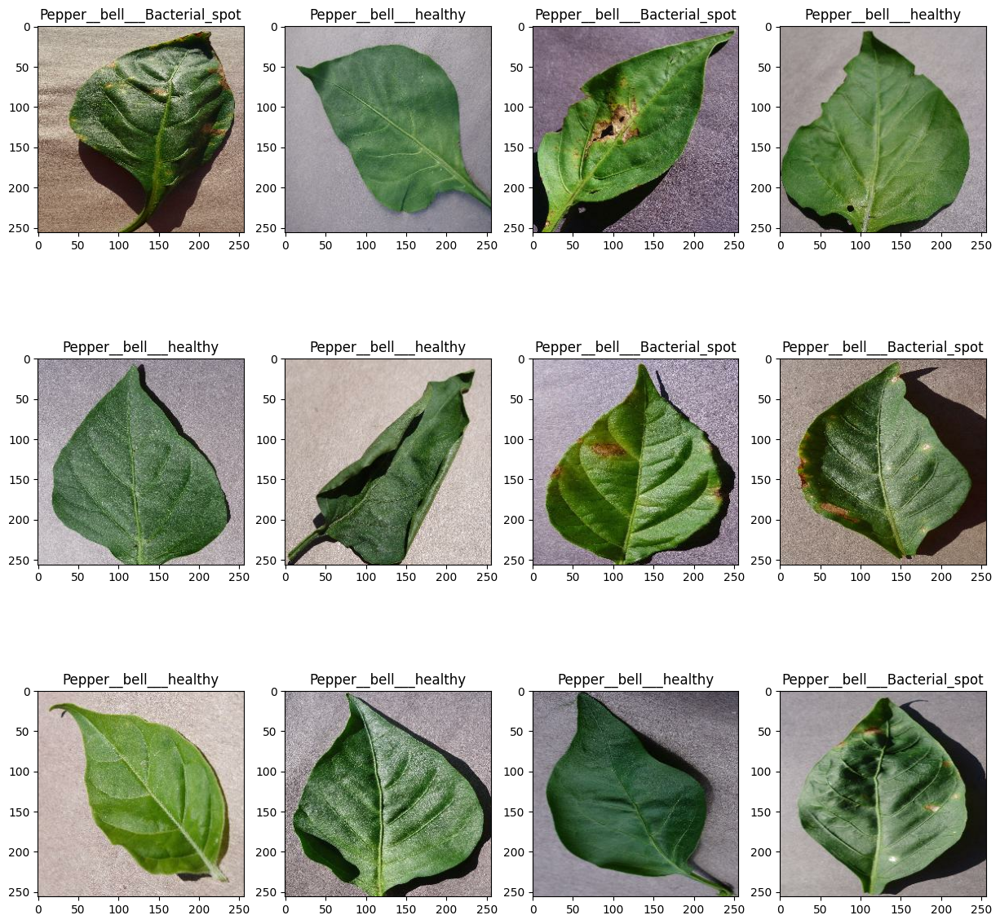

In [9]:
plotting_data(pepper_dataset,pepper_classes)

2025-07-05 21:10:00.058289: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


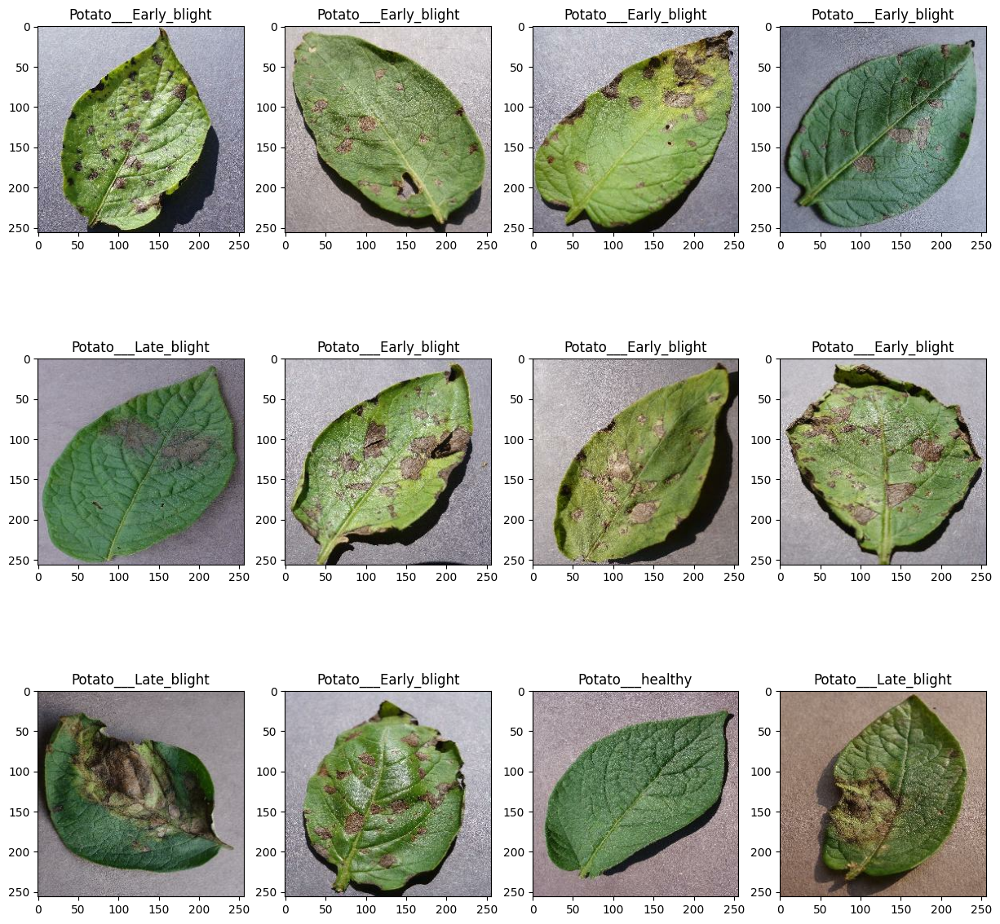

In [10]:
plotting_data(potato_dataset,potato_classes)

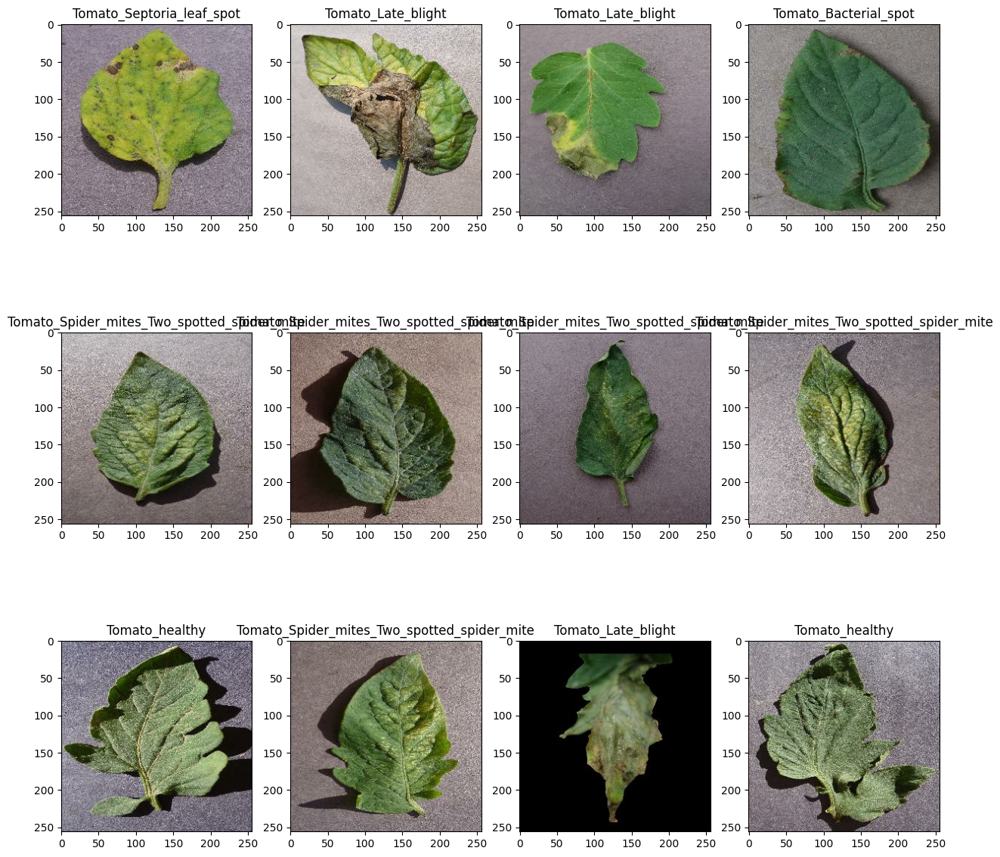

In [11]:
plotting_data(tomato_dataset,tomato_classes)

In [12]:
def get_partitions_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=1000):
    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size,seed=42)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, test_ds, val_ds

In [13]:
pepper_train_ds, pepper_test_ds, pepper_val_ds = get_partitions_tf(pepper_dataset)
potato_train_ds, potato_test_ds, potato_val_ds = get_partitions_tf(potato_dataset)
tomato_train_ds, tomato_test_ds, tomato_val_ds = get_partitions_tf(tomato_dataset)

In [17]:
model.compile(
    optimizer='adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
potato_history = model.fit(
    potato_train_ds,
    epochs=20,
    batch_size=BATCH_SIZE,
    validation_data=potato_val_ds,
    verbose=1
)

Epoch 1/20
15/54 ━━━━━━━━━━━━━━━━━━━━ 14s 369ms/step - accuracy: 0.4822 - loss: 0.9970

In [14]:
from tensorflow.keras.models import load_model

In [15]:
pepper_model = load_model('/home/abhishek/Potato_disease/models/Pepper_Model_0_1.h5')

In [16]:
potato_model = load_model('/home/abhishek/Potato_disease/models/Potato_Model_0_1.h5')

In [17]:
tomato_model = load_model('/home/abhishek/Potato_disease/models/Tomato_Model_0_1.h5')

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def get_prediction_visualization(dataset,model,classes):
    # Take a single batch of images and labels
    for img_batch, label_batch in dataset.take(1):
        preds = model.predict(img_batch)
        
        
        plt.figure(figsize=(12, 9))
        for i in range(12):  # show first 12 images
            plt.subplot(3, 4, i+1)
            plt.imshow(img_batch[i].numpy().astype("uint8"))
            pred_class = classes[np.argmax(preds[i])]
            true_class = classes[label_batch[i].numpy()]
            plt.title(f'Pred: {pred_class}\nTrue: {true_class}', fontsize=9)
            plt.axis('off')
        plt.tight_layout()
        plt.show()
        print(label_batch)


2025-07-05 21:15:22.195449: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 25165824 exceeds 10% of free system memory.
I0000 00:00:1751730324.193052  189063 cuda_dnn.cc:529] Loaded cuDNN version 90501


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


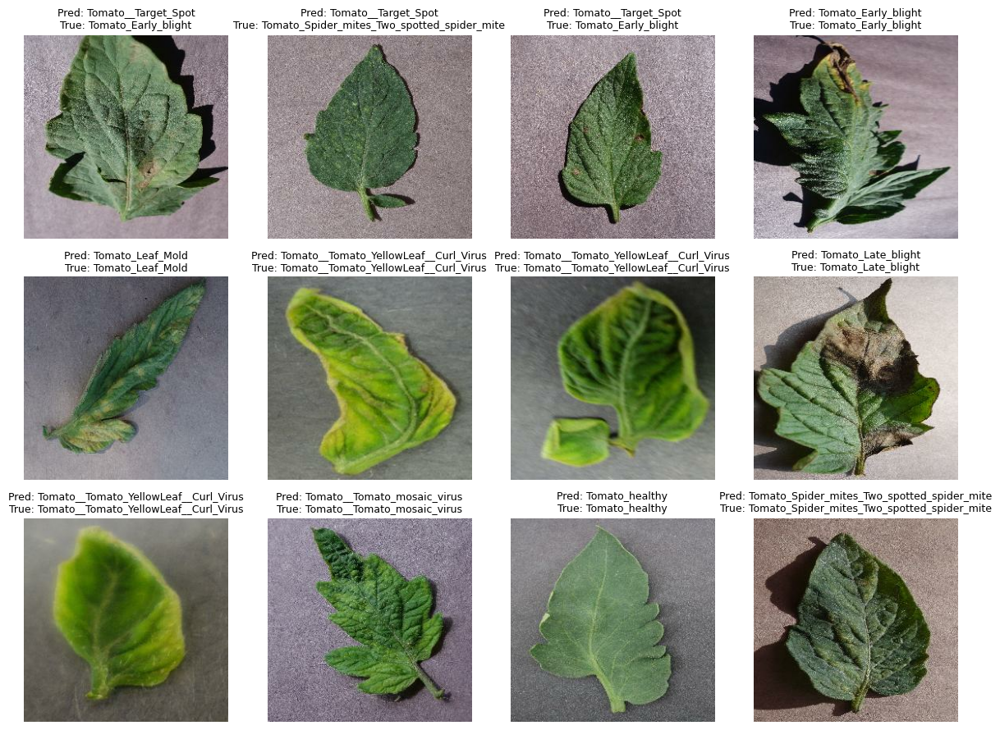

tf.Tensor([1 5 1 1 3 7 7 2 7 8 9 5 9 6 4 5 3 0 0 6 4 5 5 0 7 2 4 4 8 0 9 7], shape=(32,), dtype=int32)


2025-07-05 21:15:30.576990: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [20]:
get_prediction_visualization(tomato_dataset,tomato_model,tomato_classes)

2025-07-05 21:15:59.504845: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 25165824 exceeds 10% of free system memory.


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


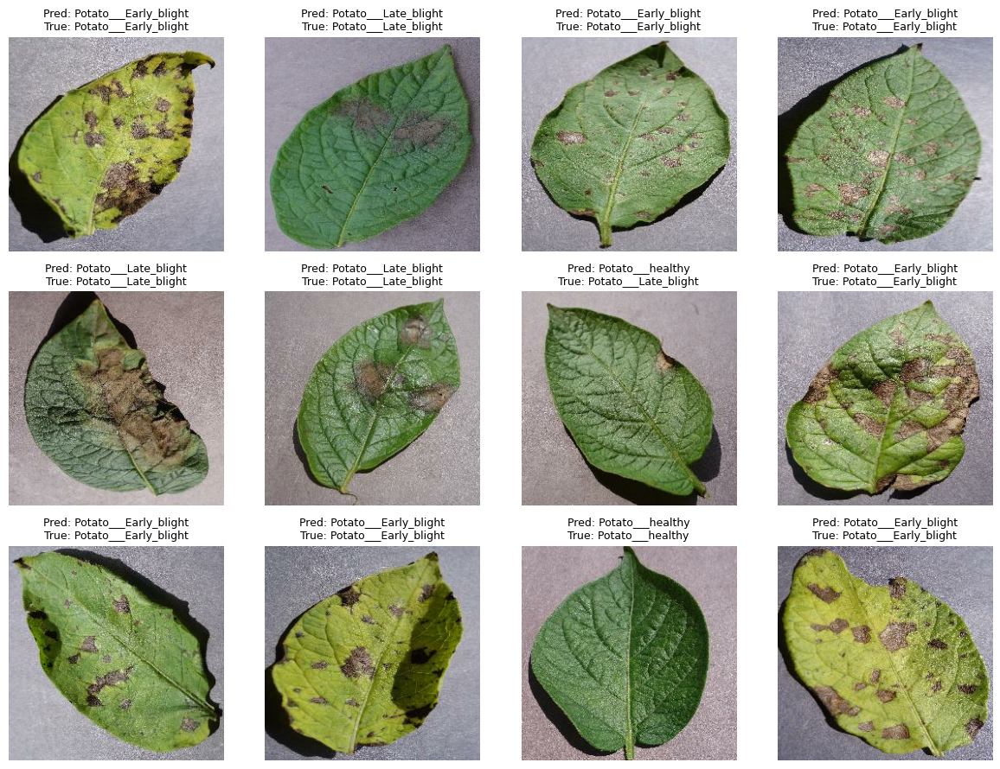

tf.Tensor([0 1 0 0 1 1 1 0 0 0 2 0 0 1 1 1 1 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0], shape=(32,), dtype=int32)


In [21]:
get_prediction_visualization(potato_dataset,potato_model,potato_classes)

2025-07-05 21:16:14.913772: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 25165824 exceeds 10% of free system memory.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


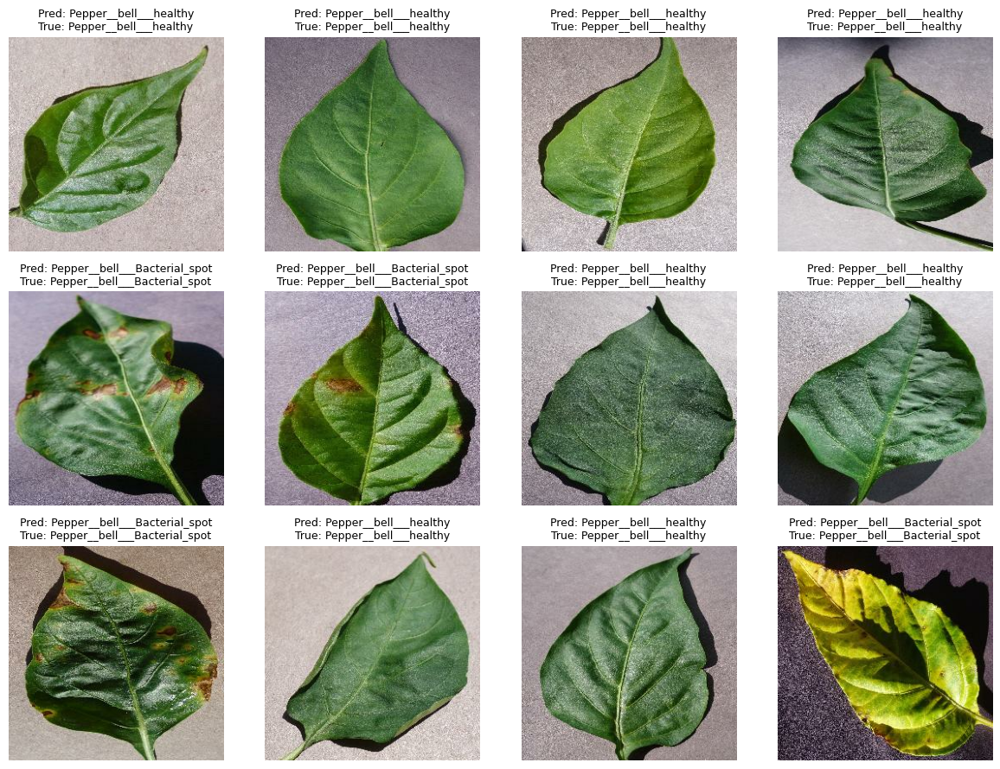

tf.Tensor([1 1 1 1 0 0 1 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 1 1 1], shape=(32,), dtype=int32)


In [22]:
get_prediction_visualization(pepper_dataset,pepper_model,pepper_classes)